<a href="https://colab.research.google.com/github/AodhanGallagher/XAI-for-Diabetic-Retinopathy-Diagnosis/blob/main/DataPreprocessing/APTOS_preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **APTOS Dataset Pre-processing**
This file is for the pre-processing of the APTOS 2019 Diabetic Retinopathy dataset based on Neuron Engineer's guide to
eye preprocessing for Diabetic Retinopathy. Their Kaggle notebook can be found at the link below:\
https://www.kaggle.com/code/ratthachat/aptos-eye-preprocessing-in-diabetic-retinopathy/notebook
\
\
Google Colab was used for the increased computation power needed to efficiently work on this project

## Mounting Google Drive

In [ ]:
# Importing and mounting my Google Drive account where the dataset is stored
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


## Imports, Setting Configuration and Parameter Setting

In [ ]:
# Importing relevant libraries for image editing, processing and saving
import os, sys, zipfile
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import PIL
import skimage.io
import cv2
import keras.backend as K
import tensorflow as tf
import warnings
from imgaug import augmenters as iaa
from tqdm import tqdm
from PIL import Image, ImageOps
from skimage.transform import resize
from sklearn.utils import class_weight, shuffle
from sklearn.model_selection import train_test_split
from keras.losses import binary_crossentropy
from keras.applications.resnet50 import preprocess_input
from sklearn.metrics import f1_score, fbeta_score
from keras.utils import Sequence
from keras.utils import to_categorical

# Ignoring warnings that are thrown
warnings.filterwarnings("ignore")

# Setting parameters
WORKERS = 2
CHANNEL = 3
IMG_SIZE = 224
NUM_CLASSES = 5
SEED = 77
TRAIN_NUM = -1

## Loading and Preparing the Data

In [ ]:
# Getting the train and test set
# NOTE: The set path name used in this .ipynb file is for accessing the dataset within my own google drive,
# this path name can be changed to match the storage location of the APTOS dataset on other devices
df_train = pd.read_csv('/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/train.csv')
df_test = pd.read_csv('/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/test.csv')

# Assigning variables from the train set
x = df_train['id_code']
y = df_train['diagnosis']

# Shuffling the dataset to ensure data is randomly ordered
x, y = shuffle(x, y, random_state=SEED)

## Train-Test Split

(3112,) (3112,) (550,) (550,)


<Axes: >

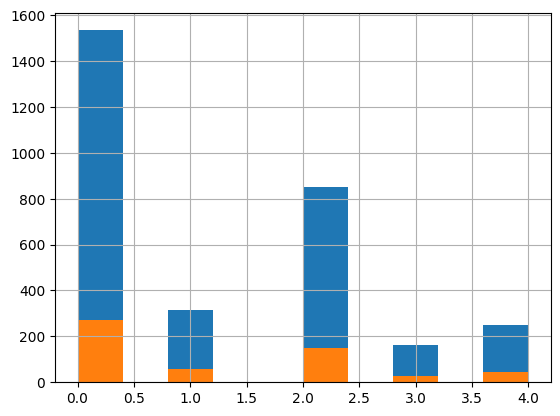

In [ ]:
# Splitting the data into training and validation sets (85% training and 15% validation)
train_x, valid_x, train_y, valid_y = train_test_split(x, y, test_size=0.15, stratify=y, random_state=SEED)

# Printing information about the number of samples in each set
print(train_x.shape, train_y.shape, valid_x.shape, valid_y.shape)

# Creating a histogram to visualise the distribution of classes in the training and validation sets
train_y.hist()
valid_y.hist()

## Displaying Un-edited Images

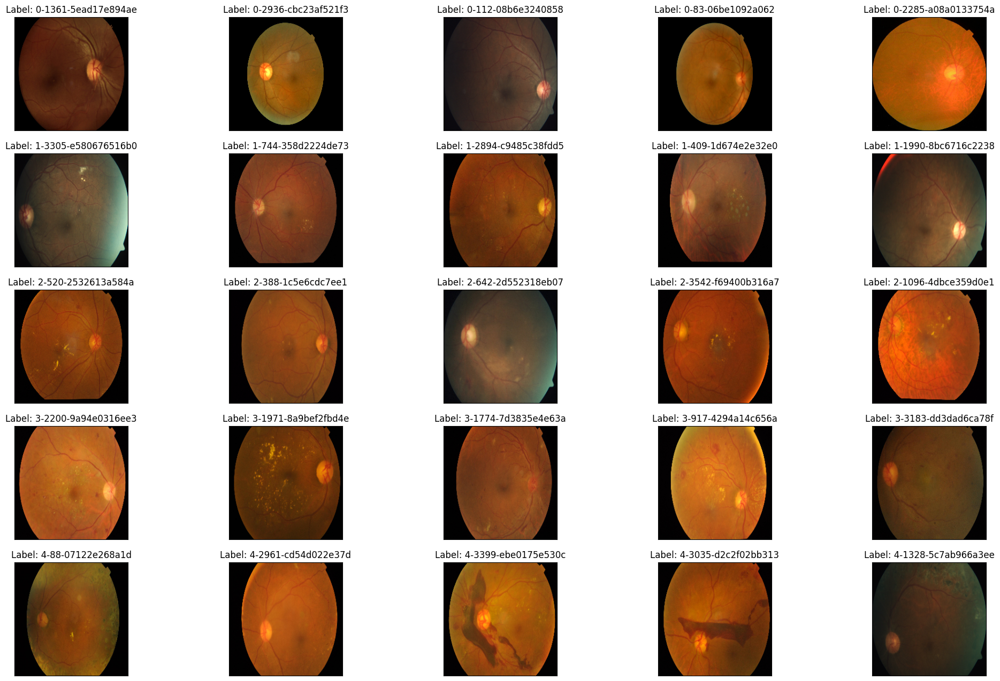

In [ ]:
# Creating a matplotlib figure
fig = plt.figure(figsize=(25, 16))

# Displaying 5 images from each class of the orginal inputs (for visual conformation of pre-processing)
# 0 - No DR, 1 - Mild DR, 2 - Moderate DR, 3 - Severe DR, 4 - Proliferative DR
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image)
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

## Displaying Grayscale Images

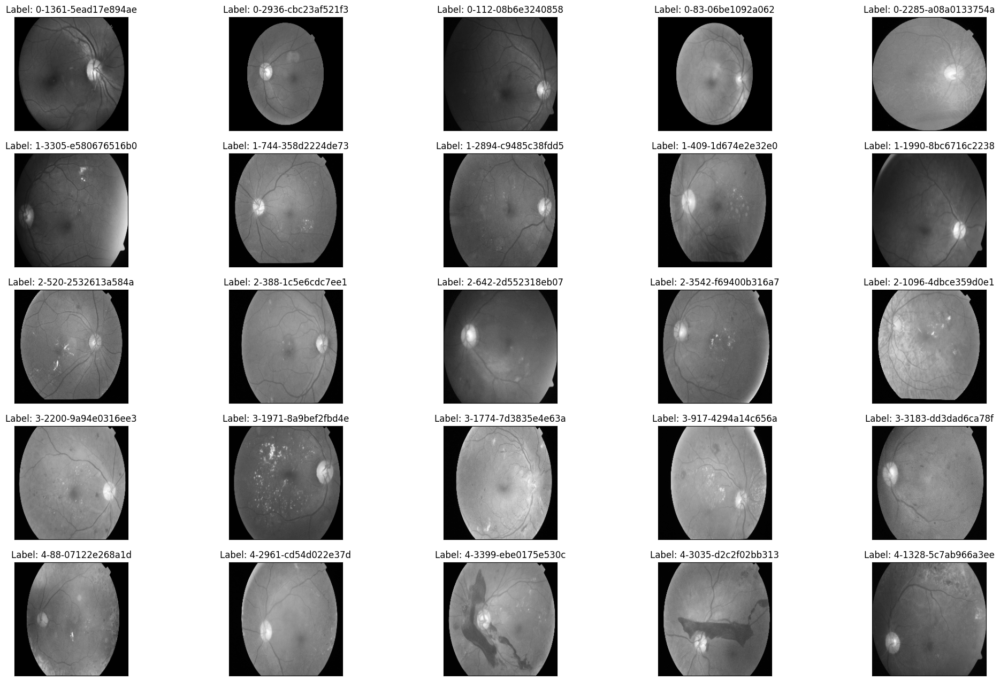

In [ ]:
# Creating a matplotlib figure
fig = plt.figure(figsize=(25, 16))

# Displaying 5 images from each class of the images converted to grayscale (for visual conformation of pre-processing)
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

## Displaying Grayscale Images with Ben Graham's Pre-processing

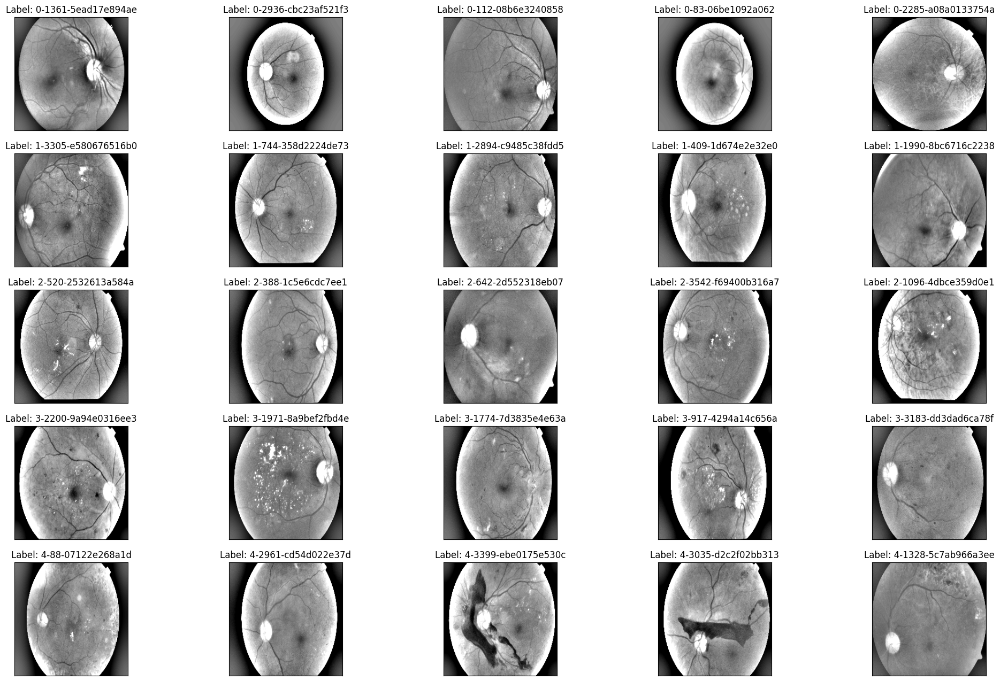

In [ ]:
# Creating a matplotlib figure
fig = plt.figure(figsize=(25, 16))

# Applying Ben Graham's pre-processing method to improve lighting conditions within the images in order to allow important details to stand out more (for grayscale first)
# Information about Ben Graham'spPre-processing method can be found at the link below:
# https://github.com/btgraham/SparseConvNet/tree/kaggle_Diabetic_Retinopathy_competition

# We then display 5 images from each class of the images with improved lighting conditions on the greyscale (for visual conformation of pre-processing)
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(5, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, 5, class_id * 5 + i + 1, xticks=[], yticks=[])
        path=f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/train_images/{row['id_code']}.png"
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
        image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , IMG_SIZE/10) ,-4 ,128)

        plt.imshow(image, cmap='gray')
        ax.set_title('Label: %d-%d-%s' % (class_id, idx, row['id_code']) )

## Defining Image Cropping Function

In [ ]:
# We then crop the images. Here I use an auto-cropping method which crops the image in a standard matter.
# Other studies have suggested circle cropping methods, however this could lead to imprtant features in the retinographs
# being left out of the resulting image, which may affect diagnosis in the machine learning model.

# Defining a method to auto-crop grayscale images
def crop_image_from_gray(img,tol=7):
    # If image is grayscale, create a mask of pixels with intensity greater than the tolerance value
    if img.ndim ==2:
        mask = img>tol
        return img[np.ix_(mask.any(1),mask.any(0))]
    # Else if image is RGB, convert image to grayscale and create a mask like before
    elif img.ndim==3:
        gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        mask = gray_img>tol

        check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0] # Checking shape of the image

        # If equal to 0, then entire image would be cropped out, so we return the original image instead
        if (check_shape == 0):
            return img
        # If cropped image contains content, apply mask to each seperate RGB channel then combine them back together
        else:
            img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
            img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
            img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
            img = np.stack([img1,img2,img3],axis=-1)
        return img # Return cropped image

## Defining Pre-processing Function to Crop Colour Images and Enhance Them

In [ ]:
# Defining a method to crop RGB colour images with Ben Graham's pre-processing method applied
def load_ben_color(path, sigmaX=10):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = crop_image_from_gray(image) # Crop image
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE)) # Resize image
    # Applying Ben Graham's Preprocessing method (using GaussianBlur) to enhance contrast and reduce noise in the resulting image
    image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)

    return image

## Displaying Images with Cropping, Ben Graham's Pre-processing and Enhancement

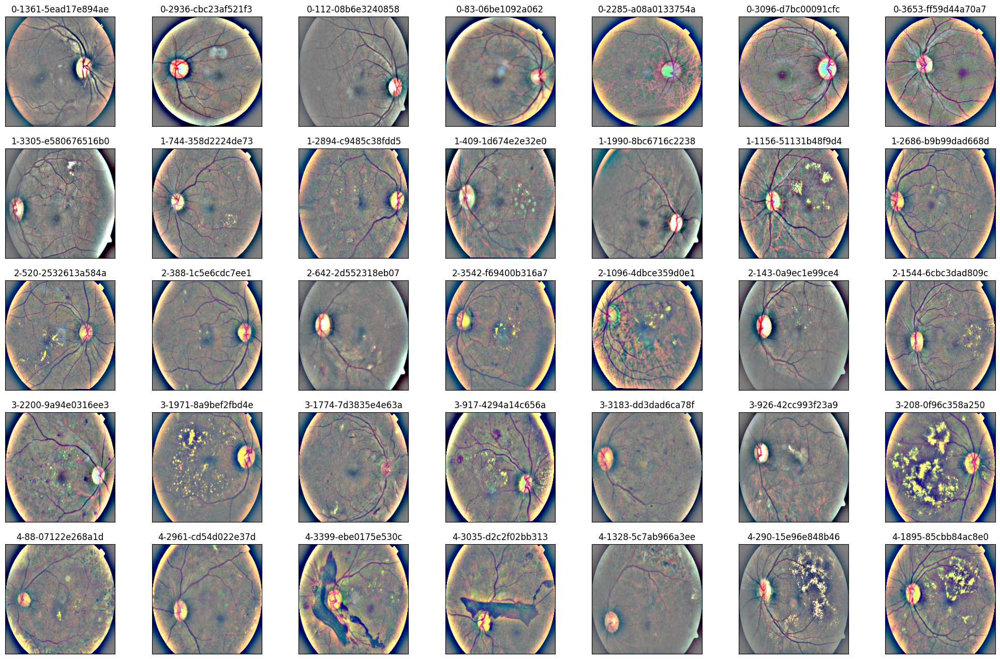

In [ ]:
# Increasing the number of samples to 7
NUM_SAMP=7

# Creating a matplotlib figure
fig = plt.figure(figsize=(25, 16))

# We then display 7 images from each class, for the images with improved lighting conditions on RGB colour images (for visual conformation of pre-processing)
for class_id in sorted(train_y.unique()):
    for i, (idx, row) in enumerate(df_train.loc[df_train['diagnosis'] == class_id].sample(NUM_SAMP, random_state=SEED).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, class_id * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/train_images/{row['id_code']}.png"
        image = load_ben_color(path,sigmaX=10) # Using the previously defined Ben Graham Preprocessing method

        plt.imshow(image)
        ax.set_title('%d-%d-%s' % (class_id, idx, row['id_code']) )

## Isolating Single Image to Verify Correct Pre-processing

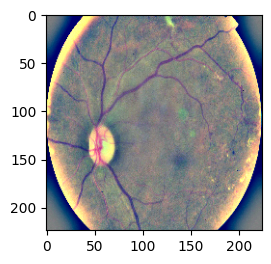

In [ ]:
# Getting a single image, applying the pre-processing techniques and enlarging it to visually confirm that the preprocessing has worked correctly.

# Increasing DPI
dpi = 80

# Getting a specific class 4 image (Proliferative DR) and applying Ben Graham's pre-processing on the colour image
path=f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/train_images/cd54d022e37d.png"
image = load_ben_color(path,sigmaX=10)

# Setting height and width variables for the image
height, width = IMG_SIZE, IMG_SIZE

# Setting the appropriate figure size
SCALE=1
figsize = (width / float(dpi))/SCALE, (height / float(dpi))/SCALE

# Displaying the image / figure
fig = plt.figure(figsize=figsize)
plt.imshow(image, cmap='gray')

## Applying Pre-Processing Methods to Test Set

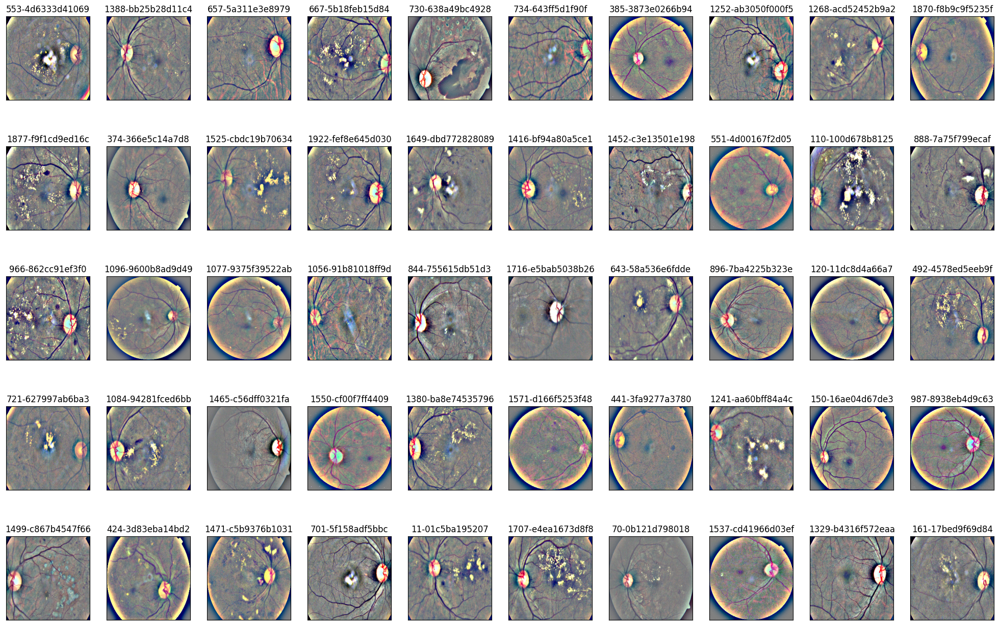

In [ ]:
# Increasing the sample size to 10
NUM_SAMP=10

# Creating a matplotlib figure
fig = plt.figure(figsize=(25, 16))

# We then display 10 images from the test set in each row, each with improved lighting conditions on the RGB colour images (for visual conformation of pre-processing)
for jj in range(5):
    for i, (idx, row) in enumerate(df_test.sample(NUM_SAMP,random_state=SEED+jj).iterrows()):
        ax = fig.add_subplot(5, NUM_SAMP, jj * NUM_SAMP + i + 1, xticks=[], yticks=[])
        path=f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/test_images/{row['id_code']}.png"
        image = load_ben_color(path, sigmaX=10)

        plt.imshow(image)
        ax.set_title('%d-%s' % (idx, row['id_code']) )

## Pre-processing Entire Dataset and Saving to New Directory

In [ ]:
# Function to get, process and save images from the dataset
def get_process_save_images(in_dir, out_dir):
    for filename in os.listdir(in_dir):
        if filename.endswith('.jpg') or filename.endswith('.png') or filename.endswith('.jpeg'): # Added for robustness / use for other datasets
            input_path = os.path.join(in_dir, filename)
            output_path = os.path.join(out_dir, filename)

            processed_image = load_ben_color(input_path,sigmaX=10) # Get image and apply Ben Graham Preprocessing
            image_pil = Image.fromarray(processed_image) # Convert image from Tensor to PIL format

            # Save processed image - by default image saves as .png (which we want for training our model)
            image_pil.save(output_path)

In [ ]:
# Specifying the input and output directories for getting and saving images from the dataset for the train images
input_directory_train = f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/train_images/"
output_directory_train = f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/ProcessedAPTOS/train_images/"

# Calling the function to get, process then save the processed images for the train set
get_process_save_images(input_directory_train, output_directory_train)

In [ ]:
# Specifying the input and output directories for getting and saving images from the dataset for the test images
input_directory_test = f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/APTOS/test_images/"
output_directory_test = f"/content/gdrive/MyDrive/Dissertation/final-year-project-AodhanGallagher/Datasets/ProcessedAPTOS/test_images/"

# Calling the function to get, process then save the processed images for the test set
get_process_save_images(input_directory_test, output_directory_test)